In [9]:
import os
import cv2
import numpy as np

In [10]:
"""
def create_mask(image_path, txt_path, output_path, num_classes=4):
    
    Crea una máscara para una imagen basada en su archivo de etiquetas (formato YOLO con coordenadas normalizadas).

    Args:
        image_path (str): Ruta a la imagen original.
        txt_path (str): Ruta al archivo de etiquetas asociado.
        output_path (str): Ruta donde se guardará la máscara generada.
        num_classes (int): Número total de clases (incluyendo fondo).
    

    # Leer la imagen para obtener sus dimensiones
    image = cv2.imread(image_path)
    img_h, img_w, _ = image.shape

    # Crear una máscara inicial (todo de clase 0 - fondo)
    mask = np.zeros((img_h, img_w), dtype=np.uint8)

    # Verificar si el archivo TXT existe y no está vacío
    if os.path.exists(txt_path):
        with open(txt_path, "r") as f:
            lines = f.readlines()

            # Si el archivo está vacío, crear una máscara de fondo completa
            if not lines:
                mask = np.zeros((img_h, img_w), dtype=np.uint8)
                print("txt vacio")
            else:
                # Procesar cada línea del archivo TXT
                for line in lines:
                    line = line.strip()
                    if not line:
                        continue  # Saltar líneas vacías

                    # Extraer los valores de la línea
                    label, x_min, y_min, x_max, y_max = map(float, line.strip().split())

                    # Convertir coordenadas normalizadas a píxeles
                    x_min = int(x_min * img_w)
                    x_max = int(x_max * img_w)
                    y_min = int(y_min * img_h)
                    y_max = int(y_max * img_h)

                    # Asegurarse de que los valores estén dentro de los límites de la imagen
                    x_min = max(0, x_min)
                    x_max = min(img_w, x_max)
                    y_min = max(0, y_min)
                    y_max = min(img_h, y_max)

                    print("txt con regiones")

                    # Dibujar el rectángulo correspondiente en la máscara
                    mask[y_min:y_max, x_min:x_max] = int(label) + 1  # Fondo es clase 0, clases comienzan en 1

    # Guardar la máscara
    mask_filename = os.path.basename(image_path).replace(".jpg", "_mask.png")
    mask_output_path = os.path.join(output_path, mask_filename)
    cv2.imwrite(mask_output_path, mask)
"""

'\ndef create_mask(image_path, txt_path, output_path, num_classes=4):\n    \n    Crea una máscara para una imagen basada en su archivo de etiquetas (formato YOLO con coordenadas normalizadas).\n\n    Args:\n        image_path (str): Ruta a la imagen original.\n        txt_path (str): Ruta al archivo de etiquetas asociado.\n        output_path (str): Ruta donde se guardará la máscara generada.\n        num_classes (int): Número total de clases (incluyendo fondo).\n    \n\n    # Leer la imagen para obtener sus dimensiones\n    image = cv2.imread(image_path)\n    img_h, img_w, _ = image.shape\n\n    # Crear una máscara inicial (todo de clase 0 - fondo)\n    mask = np.zeros((img_h, img_w), dtype=np.uint8)\n\n    # Verificar si el archivo TXT existe y no está vacío\n    if os.path.exists(txt_path):\n        with open(txt_path, "r") as f:\n            lines = f.readlines()\n\n            # Si el archivo está vacío, crear una máscara de fondo completa\n            if not lines:\n             

In [11]:
def create_mask(image_path, txt_path, output_path, num_classes=4):
    # Leer la imagen para obtener sus dimensiones
    image = cv2.imread(image_path)
    img_h, img_w, _ = image.shape

    # Crear una máscara inicial (todo de clase 0 - fondo)
    mask = np.zeros((img_h, img_w), dtype=np.uint8)

    # Verificar si el archivo TXT tiene datos
    if os.path.exists(txt_path) and os.path.getsize(txt_path) > 0:
        with open(txt_path, "r") as f:
            lines = f.readlines()

        # Procesar cada línea del archivo TXT
        for line in lines:
            label, x_center, y_center, width, height = map(float, line.strip().split())
            
            # Convertir coordenadas normalizadas a píxeles
            x_min = int((x_center - width / 2) * img_w)
            x_max = int((x_center + width / 2) * img_w)
            y_min = int((y_center - height / 2) * img_h)
            y_max = int((y_center + height / 2) * img_h)

            # Asegurarse de que los valores estén dentro de los límites de la imagen
            x_min = max(0, x_min)
            x_max = min(img_w, x_max)
            y_min = max(0, y_min)
            y_max = min(img_h, y_max)

            # Dibujar el rectángulo correspondiente en la máscara
            mask[y_min:y_max, x_min:x_max] = int(label) + 1  # Fondo es clase 0, clases comienzan en 1

    # Guardar la máscara
    mask_filename = os.path.basename(image_path).replace(".jpg", "_mask.png")
    mask_output_path = os.path.join(output_path, mask_filename)
    cv2.imwrite(mask_output_path, mask)

In [12]:
def process_dataset(dataset_dir, output_dir, num_classes=4):
    os.makedirs(output_dir, exist_ok=True)

    for filename in os.listdir(dataset_dir):
        if filename.endswith(".jpg"):  # Procesar solo imágenes
            image_path = os.path.join(dataset_dir, filename)
            print(image_path)
            txt_path = os.path.join(dataset_dir, filename.replace(".jpg", ".txt"))
            print(txt_path)
            create_mask(image_path, txt_path, output_dir, num_classes)

In [13]:
train_dir = "train"  # Carpeta que contiene las imágenes y etiquetas de entrenamiento
val_dir = "val"      # Carpeta que contiene las imágenes y etiquetas de validación
output_train_dir = "masks/train"  # Carpeta para guardar las máscaras generadas de entrenamiento
output_val_dir = "masks/val"

In [ ]:
# Generar máscaras para entrenamiento y prueba
process_dataset(train_dir, output_train_dir)
process_dataset(val_dir, output_val_dir)

In [15]:
def visualize_mask(image_path, mask_path):
    # Leer imagen y máscara
    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    # Aplicar un colormap para visualizar la máscara
    colored_mask = cv2.applyColorMap(mask * 50, cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(image, 0.7, colored_mask, 0.3, 0)

    # Mostrar resultado
    cv2.imshow("Image with Mask", overlay)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Ejemplo de visualización
image_path = "train/frame_6260.jpg"
mask_path = "masks/train/frame_6260_mask.png"
visualize_mask(image_path, mask_path)


In [16]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

def visualize_masks_with_matplotlib(image_dir, mask_dir, num_examples=5):
    """
    Visualiza varias imágenes y sus máscaras generadas usando matplotlib.
    
    Args:
    - image_dir (str): Directorio que contiene las imágenes originales.
    - mask_dir (str): Directorio que contiene las máscaras generadas.
    - num_examples (int): Número de ejemplos a mostrar.
    """
    # Obtener lista de imágenes y máscaras
    images = [f for f in os.listdir(image_dir) if f.endswith(".jpg")]
    masks = [f for f in os.listdir(mask_dir) if f.endswith("_mask.png")]

    # Ordenar para emparejar imágenes y máscaras por nombre
    images.sort()
    masks.sort()

    random_indices = random.sample(range(len(images)), num_examples)
    # Seleccionar ejemplos
    examples = []
    for index in random_indices:
        examples.append((images[index], masks[index]))

    # Crear subplots
    fig, axes = plt.subplots(len(examples), 2, figsize=(10, 5 * len(examples)))

    for i, (image_name, mask_name) in enumerate(examples):
        # Leer imagen y máscara
        image_path = os.path.join(image_dir, image_name)
        mask_path = os.path.join(mask_dir, mask_name)

        image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        # Aplicar un colormap a la máscara para visualización
        colored_mask = cv2.applyColorMap(mask * 50, cv2.COLORMAP_JET)

        # Mostrar imagen y máscara en el subplot
        axes[i, 0].imshow(image)
        axes[i, 0].set_title(f"Original Image: {image_name}")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(image)
        axes[i, 1].imshow(colored_mask, alpha=0.5)
        axes[i, 1].set_title(f"Image with Mask: {mask_name}")
        axes[i, 1].axis("off")

    plt.tight_layout()
    plt.show()



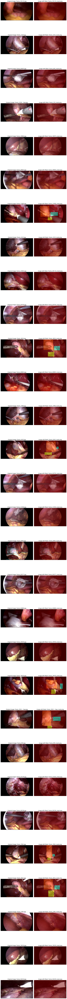

In [17]:
# Directorios de imágenes y máscaras generadas
train_image_dir = "train"       # Directorio de imágenes de entrenamiento
train_mask_dir = "masks/train"  # Directorio de máscaras generadas

# Visualizar ejemplos
visualize_masks_with_matplotlib(train_image_dir, train_mask_dir,30)